In [8]:
!pip uninstall opencv-python -y
!pip install opencv-python-headless
!pip install pycocotools 

Found existing installation: opencv-python 4.8.0.74
Uninstalling opencv-python-4.8.0.74:
  Successfully uninstalled opencv-python-4.8.0.74
  Using cached opencv_python_headless-4.8.0.74-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (49.1 MB)


https://cocodataset.org/#home

Object segmentation

Recognition in context

Superpixel stuff segmentation

330K images (>200K labeled)

1.5 million object instances

80 object categories

91 stuff categories

5 captions per image

250,000 people with keypoints

#1. Download COCO validation dataset

In [10]:
!pip install requests

import os
import requests
import zipfile

def download_file(url, target_path):
    response = requests.get(url, stream=True)
    handle = open(target_path, "wb")
    for chunk in response.iter_content(chunk_size=512):
        if chunk:  # filter out keep-alive new chunks
            handle.write(chunk)
    handle.close()

def extract_zip(zip_path, target_path):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(target_path)

# URLs for the images and annotations
images_url = "http://images.cocodataset.org/zips/val2017.zip"
annotations_url = "http://images.cocodataset.org/annotations/annotations_trainval2017.zip"

# Paths to download the zip files
images_zip_path = "val2017.zip"
annotations_zip_path = "annotations_trainval2017.zip"

# Path to extract the datasets
coco_folder = "coco_dataset"

# Ensure the target path exists
os.makedirs(coco_folder, exist_ok=True)

# Download files
print("Downloading images...")
download_file(images_url, images_zip_path)

print("Downloading annotations...")
download_file(annotations_url, annotations_zip_path)

# Extract files
print("Extracting images...")
extract_zip(images_zip_path, coco_folder)

print("Extracting annotations...")
extract_zip(annotations_zip_path, coco_folder)

print("Done.")

Extracting images...
Extracting annotations...
Done.


#2. Convert binary images

In [18]:
!pwd
import os
os.chdir('cut')
!pwd

/root/353865_POC_Research_Best_Way_To_Handle_Each_Style/dataset
/root/353865_POC_Research_Best_Way_To_Handle_Each_Style/dataset/cut


In [28]:
import os
import cv2
import numpy as np
from pycocotools.coco import COCO
import matplotlib.pyplot as plt
from PIL import Image

# Initialize the COCO API for instance annotations
coco_folder = 'coco_dataset'
data_type = 'val2017'  # choose your dataset: 'train2017', 'val2017', 'test2017'
instances_annFile = os.path.join(coco_folder, 'annotations', f'instances_{data_type}.json')
captions_annFile = os.path.join(coco_folder, 'annotations', f'captions_{data_type}.json')

instances_coco = COCO(instances_annFile)
captions_coco = COCO(captions_annFile)

# Define animal categories in COCO (as of COCO 2017)
animal_categories = ['bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe']

# Output folder for the binary images
output_folder = 'binary_dataset'
os.makedirs(output_folder, exist_ok=True)

# Initialize image counter
image_counter = 0

# Go through all of the images
for image_id in instances_coco.imgs.keys():
    # Break loop after 300 images
    if image_counter >= 300:
        break

    # Get image metadata
    img_metadata = instances_coco.imgs[image_id]
    path = os.path.join(coco_folder, data_type, img_metadata['file_name'])
    
    # Load image
    img = cv2.imread(path)
    
    # Get annotation ids for the image
    ann_ids = instances_coco.getAnnIds(imgIds=image_id)
    anns = instances_coco.loadAnns(ann_ids)
    
    # Process each annotation (object)
    for i, ann in enumerate(anns):
        # Check if category is an animal
        category = instances_coco.loadCats(ann['category_id'])[0]['name']
        if category not in animal_categories:
            continue

        # Create mask
        mask = instances_coco.annToMask(ann)
        
        # Apply mask on the image (gets the object segment)
        obj = cv2.bitwise_and(img, img, mask=mask)
        
        # Convert to binary image
        _, binary = cv2.threshold(cv2.cvtColor(obj, cv2.COLOR_BGR2GRAY), 1, 255, cv2.THRESH_BINARY)

        # Find contours
        contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        # Invert binary image
        binary = 255 - binary
        
        if contours:
            # Get bounding box of the largest contour
            cnt = max(contours, key=cv2.contourArea)
            x, y, w, h = cv2.boundingRect(cnt)

            # Calculate the center of the bounding box
            center_x = x + w//2
            center_y = y + h//2

            # Create a square bounding box around the center of the object that includes the original bounding box
            half_len = max(w, h) // 2
            x_min = center_x - half_len
            y_min = center_y - half_len
            x_max = center_x + half_len
            y_max = center_y + half_len

            # Extend bounding box by 10% to add margin
            margin = 0.1
            x_min -= int(w * margin)
            y_min -= int(h * margin)
            x_max += int(w * margin)
            y_max += int(h * margin)

            # If bounding box goes beyond original image, extend the image by padding zeros
            if x_min < 0 or y_min < 0 or x_max > img.shape[1] or y_max > img.shape[0]:
                left_padding = abs(min(0, x_min))
                top_padding = abs(min(0, y_min))
                right_padding = max(0, x_max - img.shape[1])
                bottom_padding = max(0, y_max - img.shape[0])
                binary = cv2.copyMakeBorder(binary, top_padding, bottom_padding, left_padding, right_padding, cv2.BORDER_CONSTANT, value=255)
                x_min += left_padding
                y_min += top_padding
                x_max += left_padding
                y_max += top_padding

            # Crop the image
            binary_cropped = binary[y_min:y_max, x_min:x_max]

            # Resize the image to 512x512
            binary_resized = cv2.resize(binary_cropped, (512, 512), interpolation=cv2.INTER_AREA)
            
            # Get corresponding caption
            caption_ann_ids = captions_coco.getAnnIds(imgIds=image_id)
            caption_anns = captions_coco.loadAnns(caption_ann_ids)
            description = caption_anns[i]['caption'] if i < len(caption_anns) else ""

            # Save binary image
            binary_img_path = os.path.join(output_folder, f"{image_id}_{i}.png")
            cv2.imwrite(binary_img_path, binary_resized)
            
            # Save description
            with open(os.path.join(output_folder, f"{image_id}_{i}.txt"), 'w') as f:
                f.write(description)

        # Increment image counter only if an animal was found
        image_counter += 1

loading annotations into memory...
Done (t=1.23s)
creating index...
index created!
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!


#3. Demostrate the result

coco_dataset/val2017/000000181666.jpg


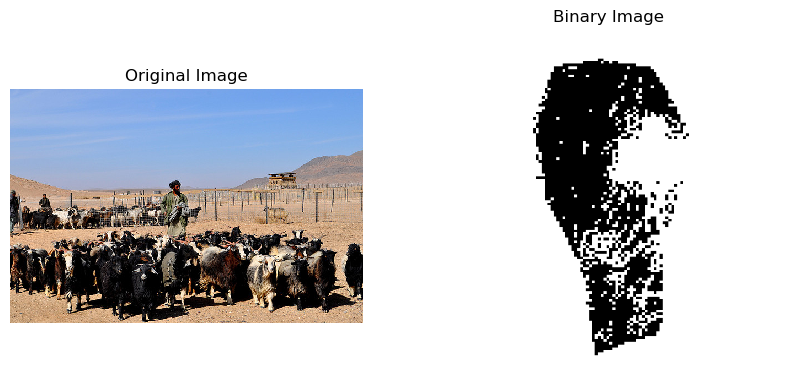

coco_dataset/val2017/000000402992.jpg


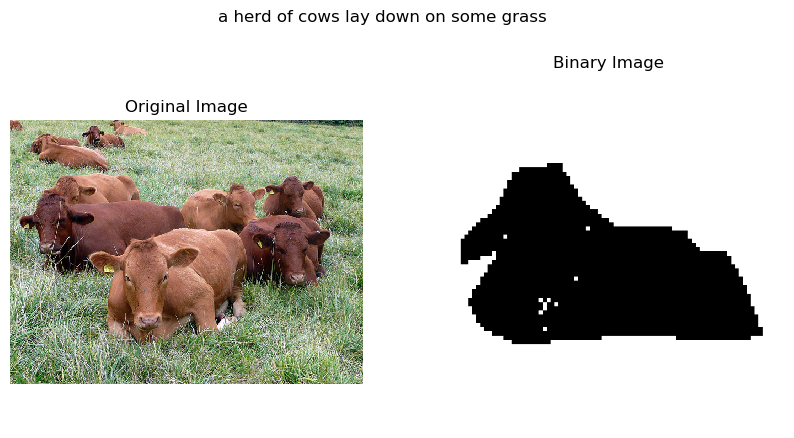

coco_dataset/val2017/000000172547.jpg


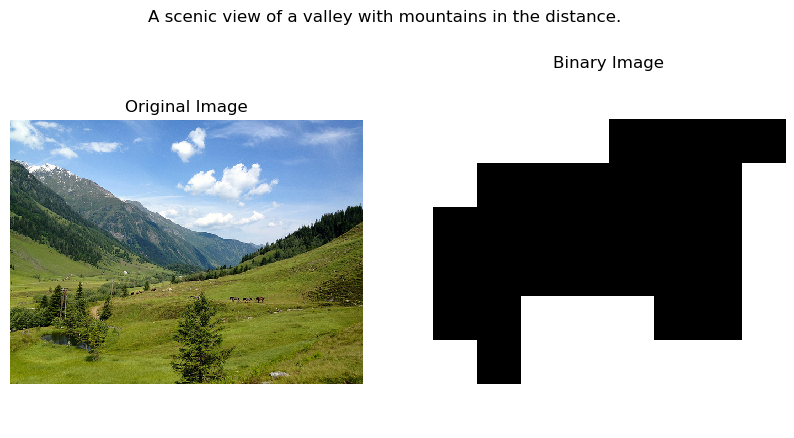

coco_dataset/val2017/000000153299.jpg


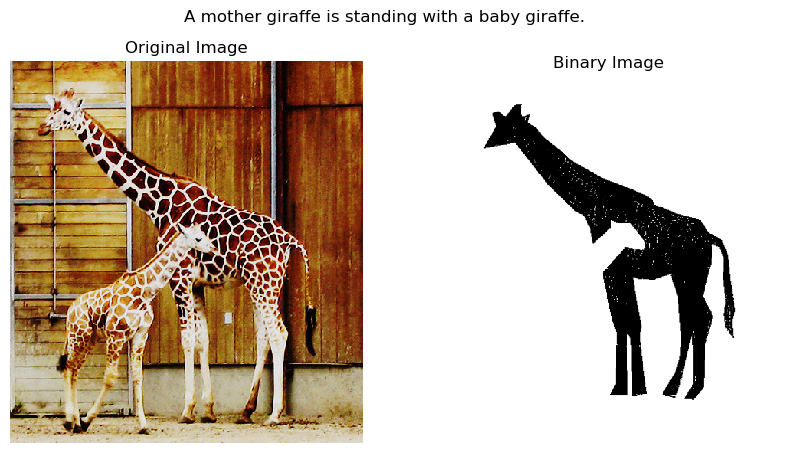

coco_dataset/val2017/000000450758.jpg


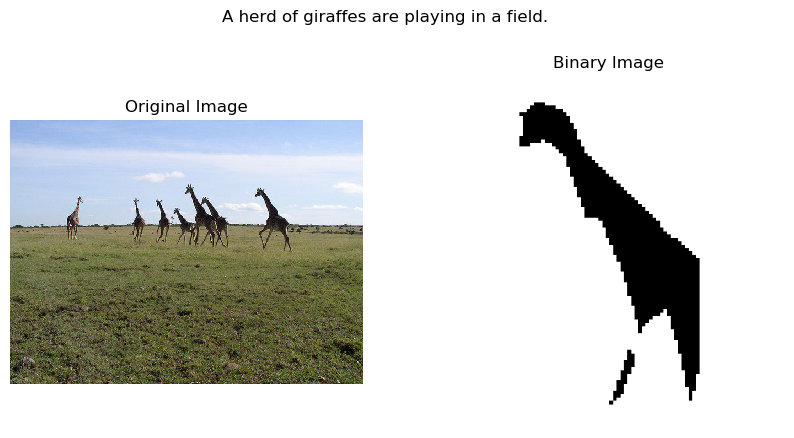

coco_dataset/val2017/000000311295.jpg


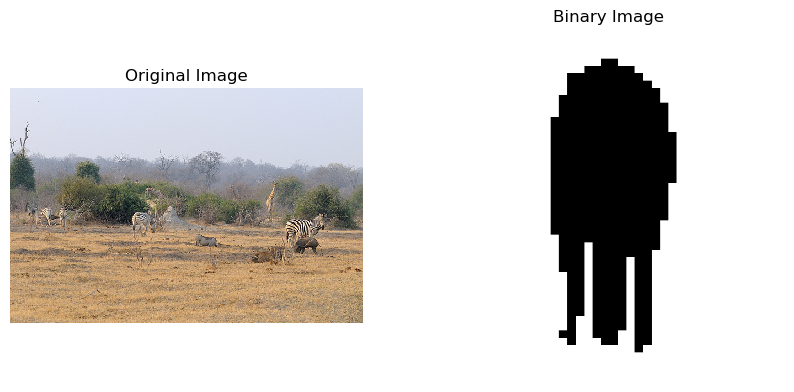

coco_dataset/val2017/000000212559.jpg


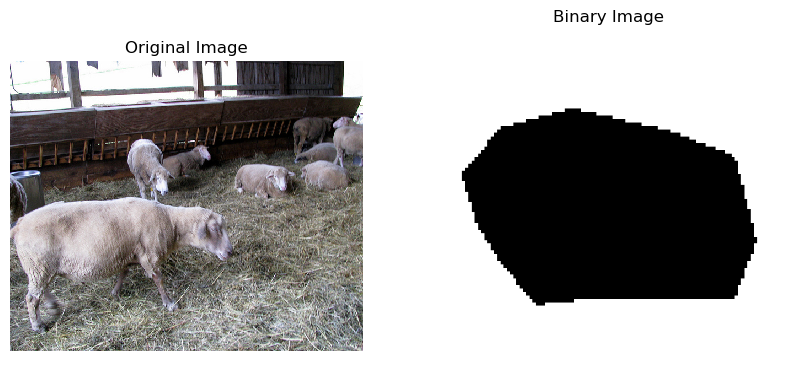

coco_dataset/val2017/000000154947.jpg


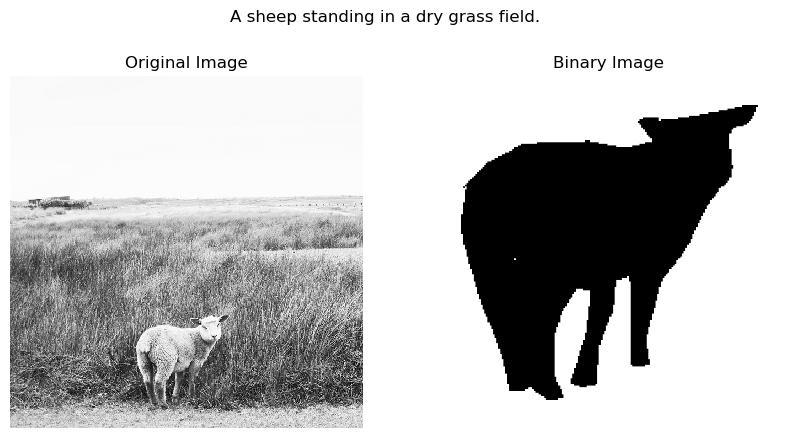

coco_dataset/val2017/000000516316.jpg


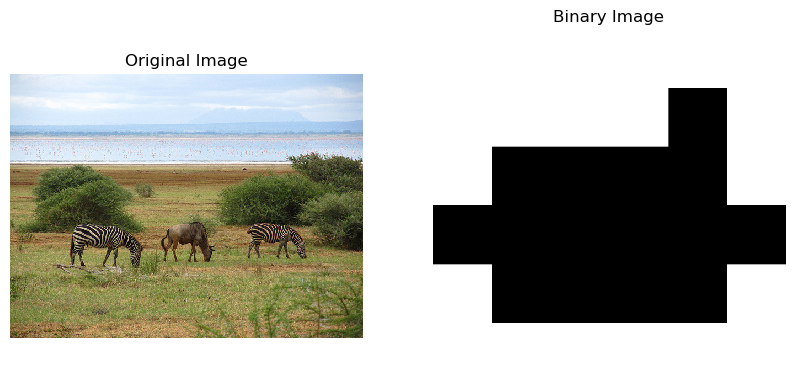

coco_dataset/val2017/000000041888.jpg


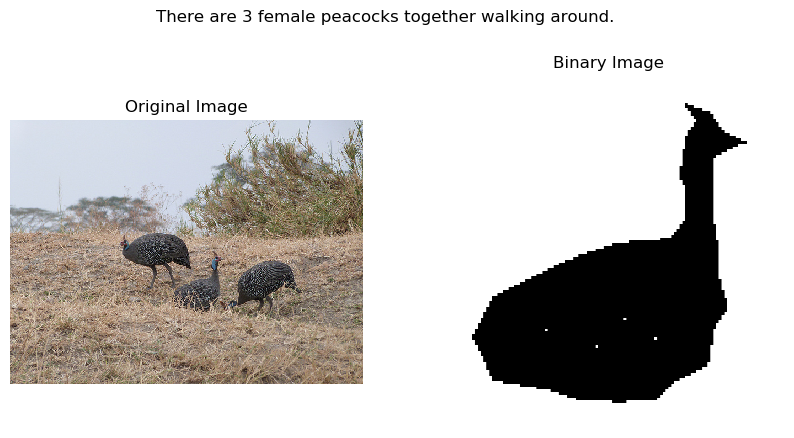

coco_dataset/val2017/000000181666.jpg


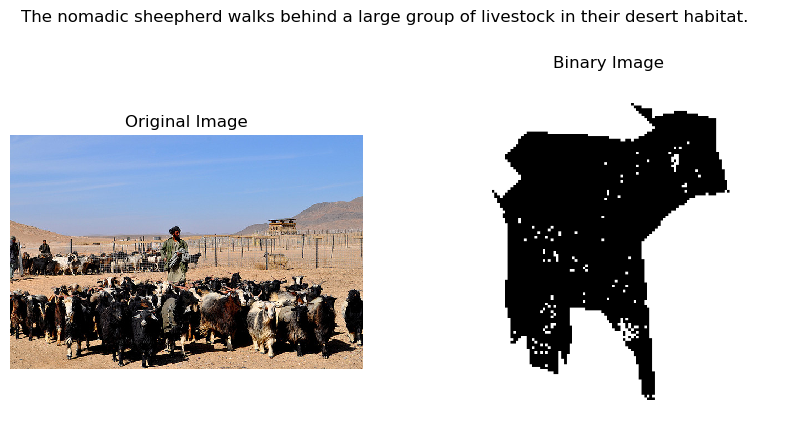

coco_dataset/val2017/000000545826.jpg


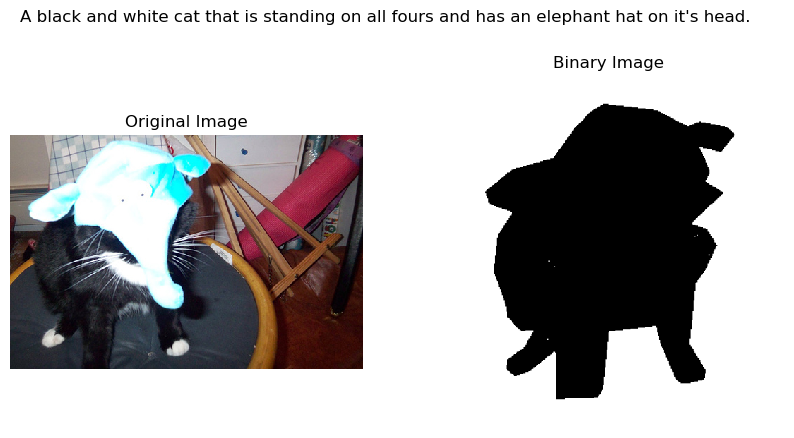

coco_dataset/val2017/000000286994.jpg


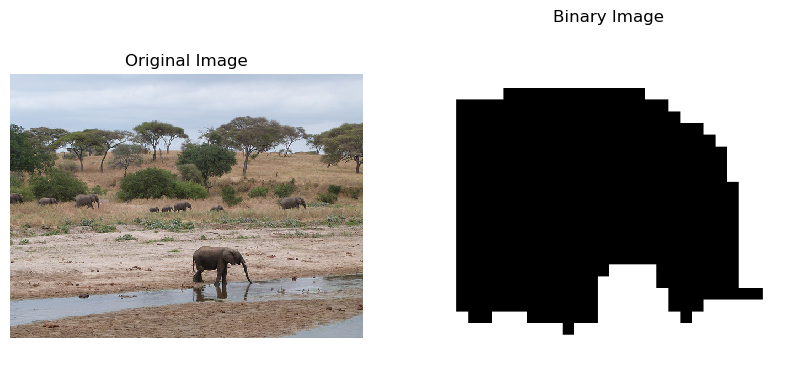

coco_dataset/val2017/000000367680.jpg


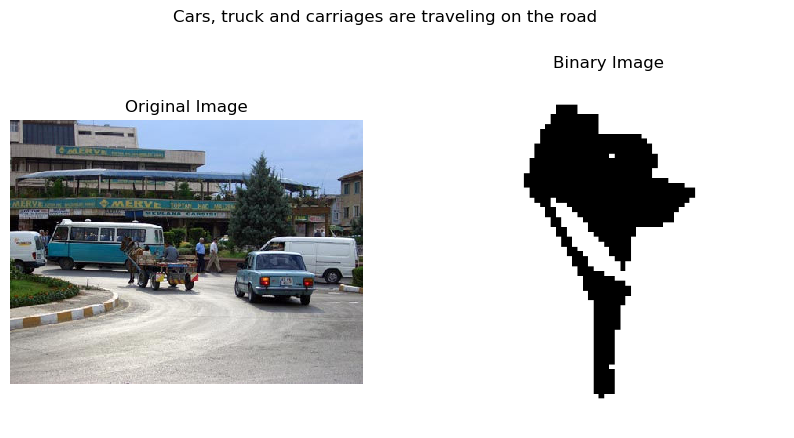

coco_dataset/val2017/000000516316.jpg


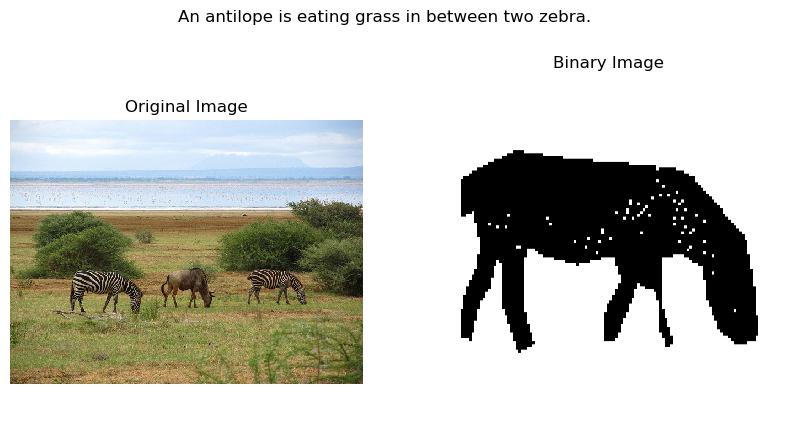

coco_dataset/val2017/000000314034.jpg


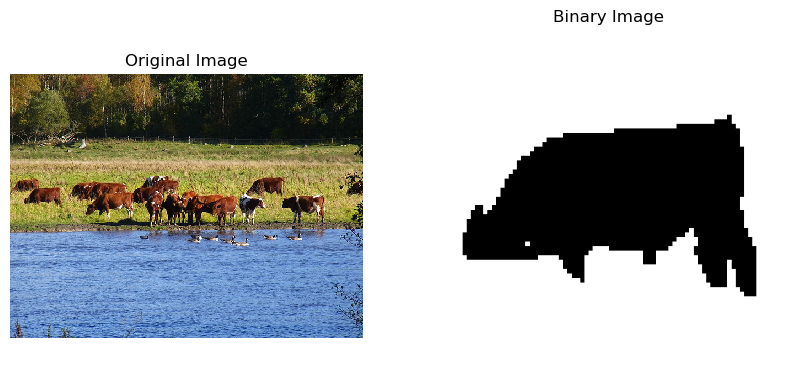

coco_dataset/val2017/000000461405.jpg


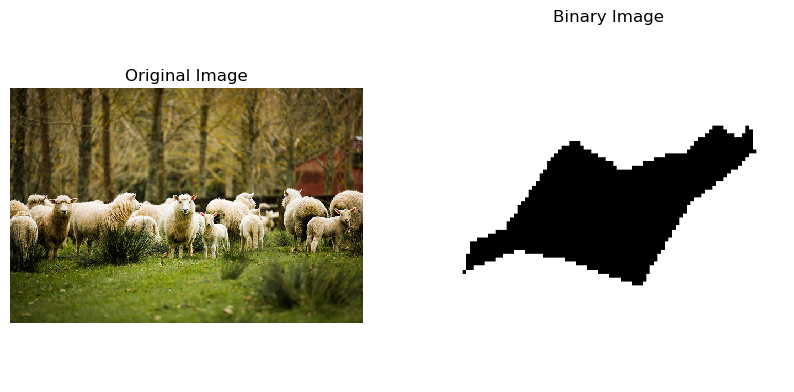

coco_dataset/val2017/000000564133.jpg


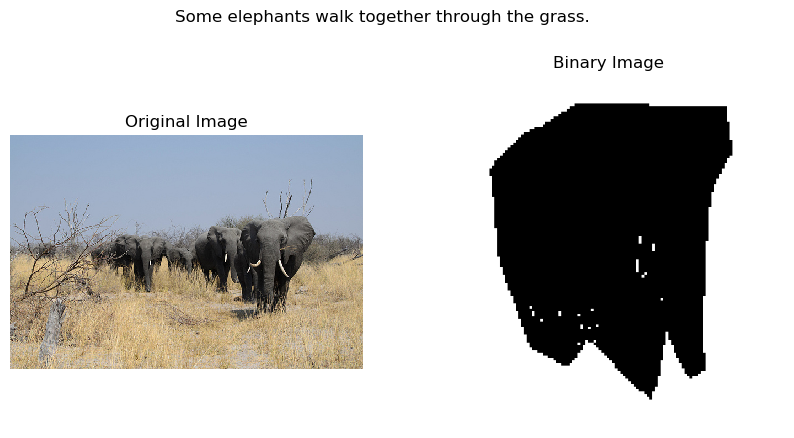

coco_dataset/val2017/000000286994.jpg


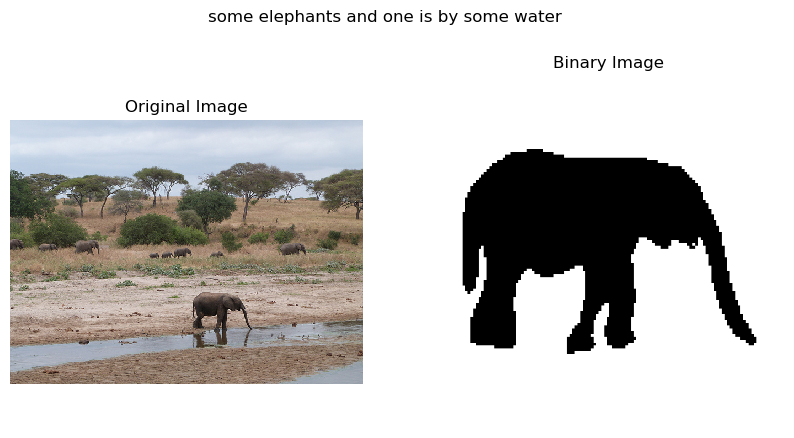

coco_dataset/val2017/000000151662.jpg


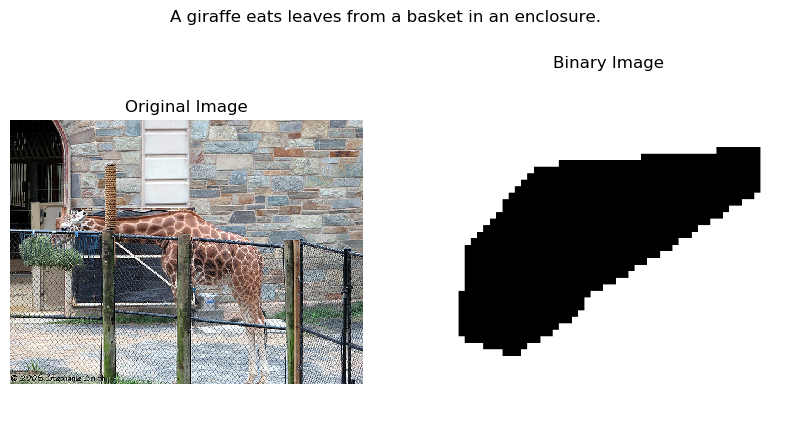

coco_dataset/val2017/000000410428.jpg


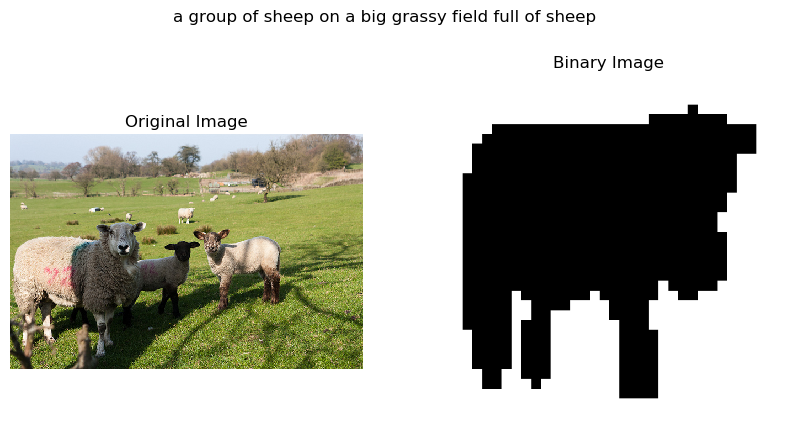

coco_dataset/val2017/000000205834.jpg


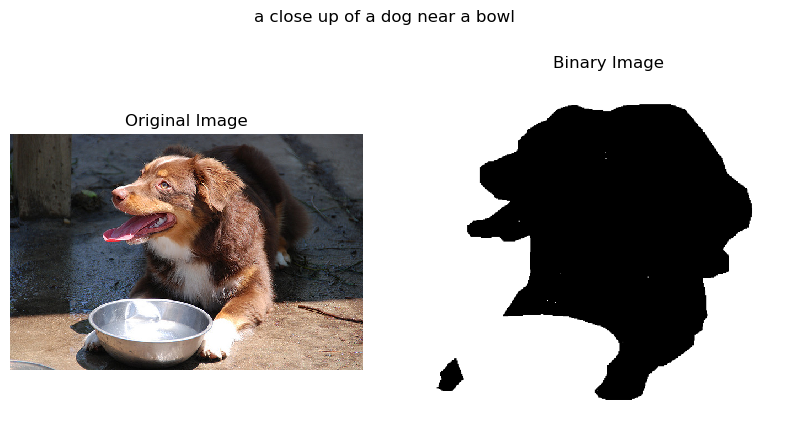

coco_dataset/val2017/000000295231.jpg


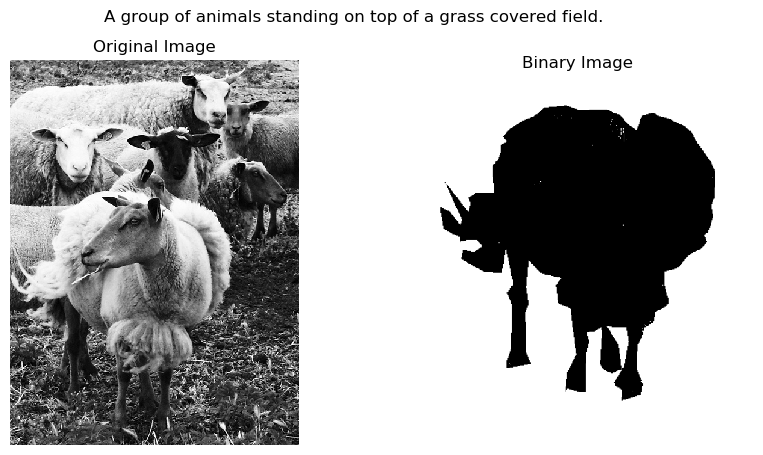

coco_dataset/val2017/000000031269.jpg


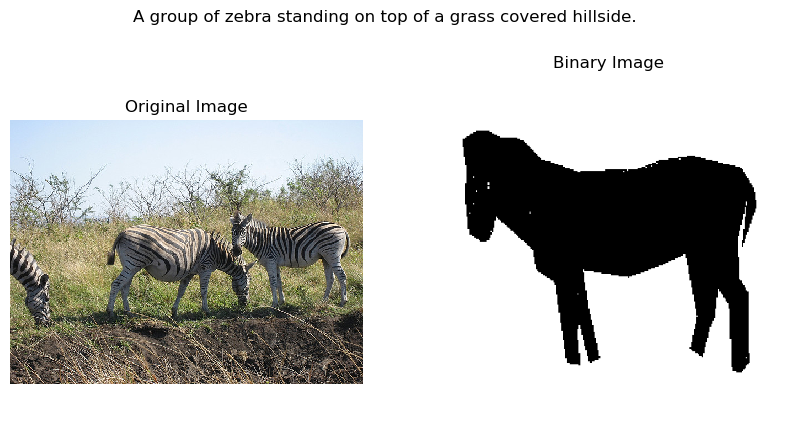

coco_dataset/val2017/000000314034.jpg


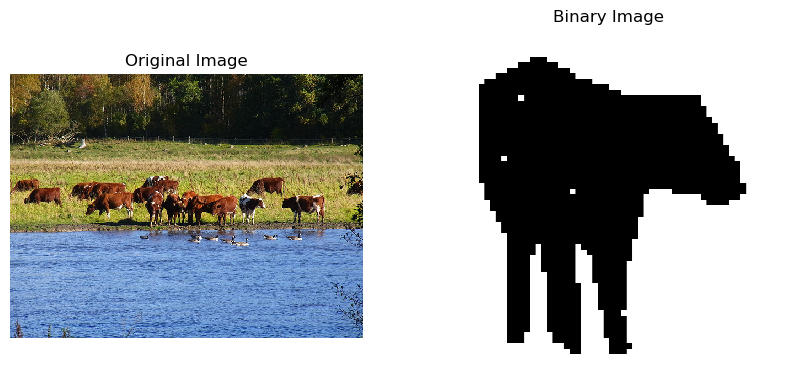

coco_dataset/val2017/000000500663.jpg


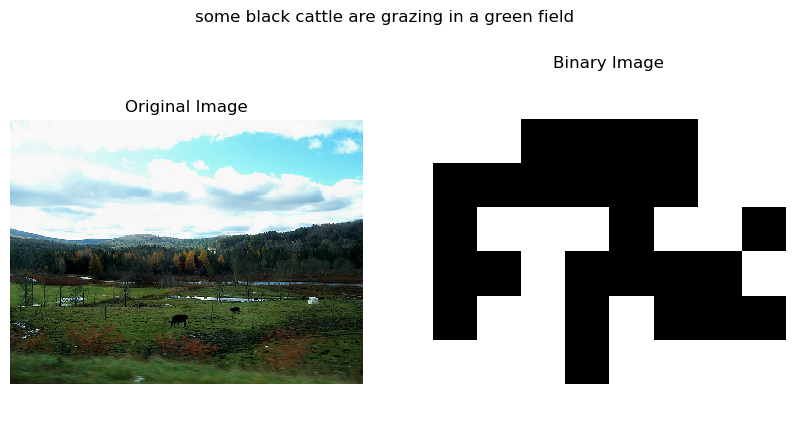

coco_dataset/val2017/000000314034.jpg


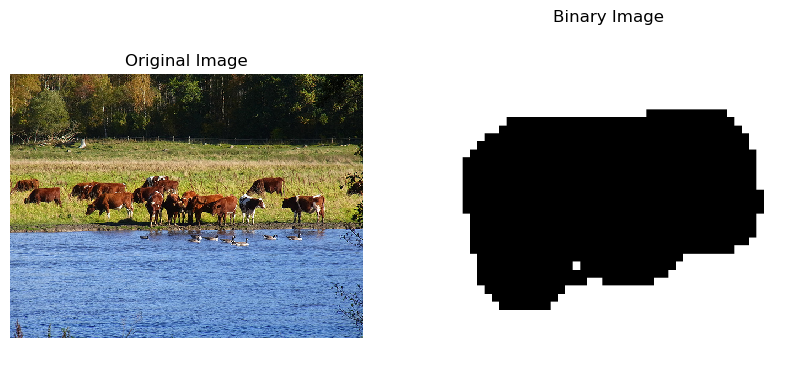

coco_dataset/val2017/000000152740.jpg


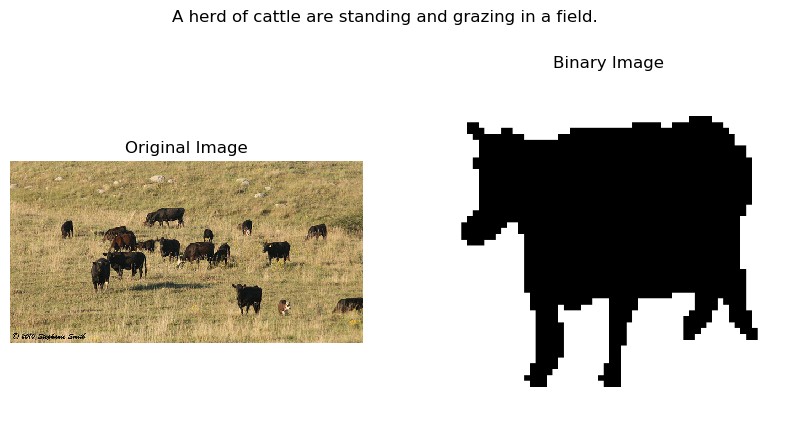

coco_dataset/val2017/000000098839.jpg


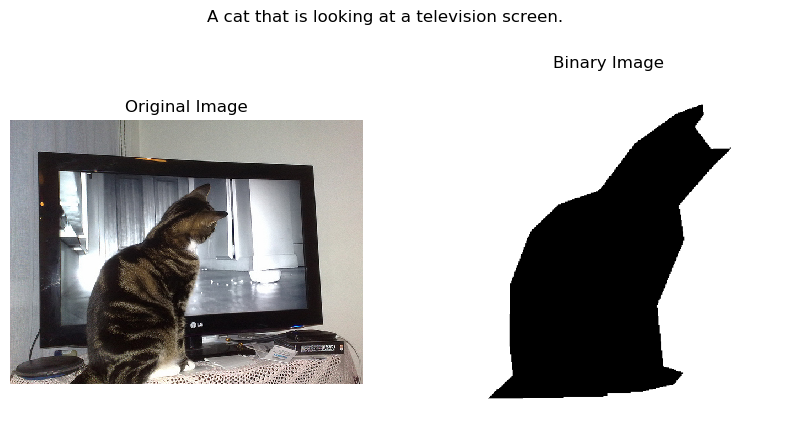

coco_dataset/val2017/000000302165.jpg


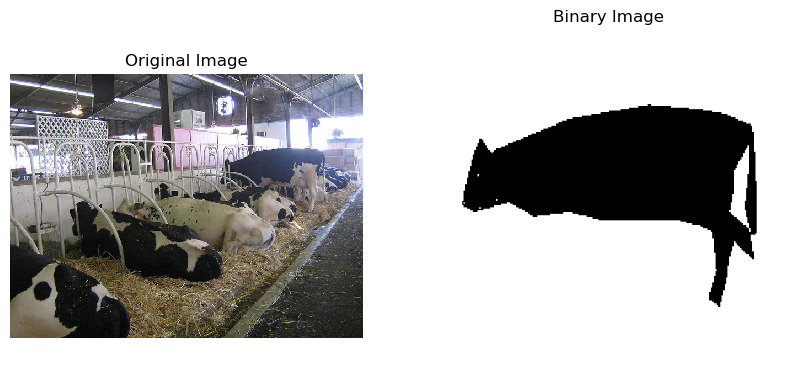

coco_dataset/val2017/000000461405.jpg


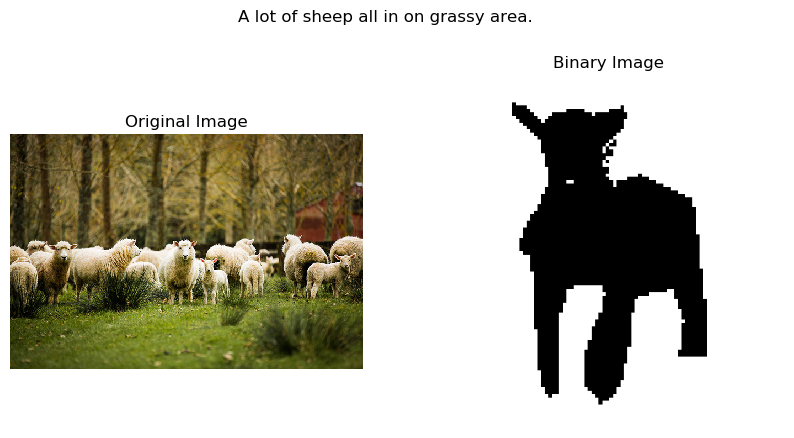

coco_dataset/val2017/000000360661.jpg


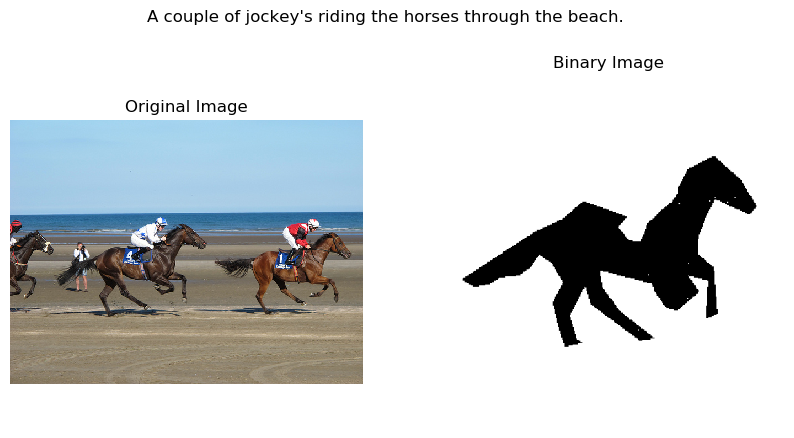

coco_dataset/val2017/000000152740.jpg


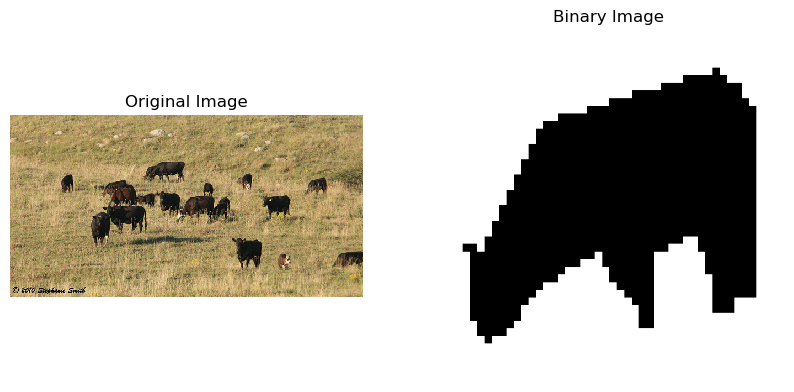

coco_dataset/val2017/000000311295.jpg


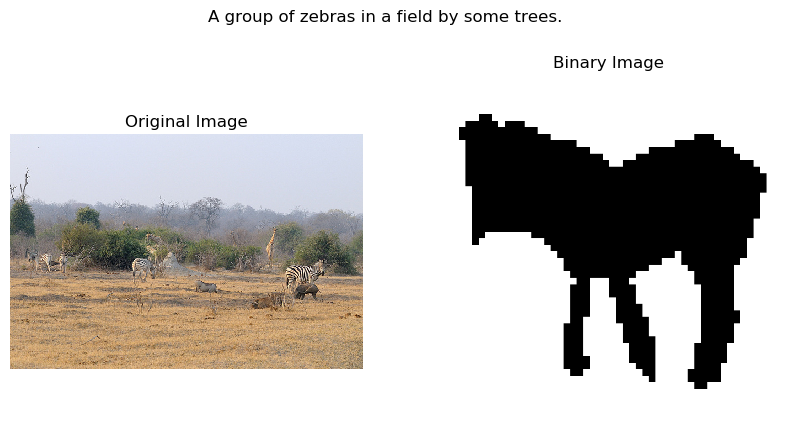

coco_dataset/val2017/000000366141.jpg


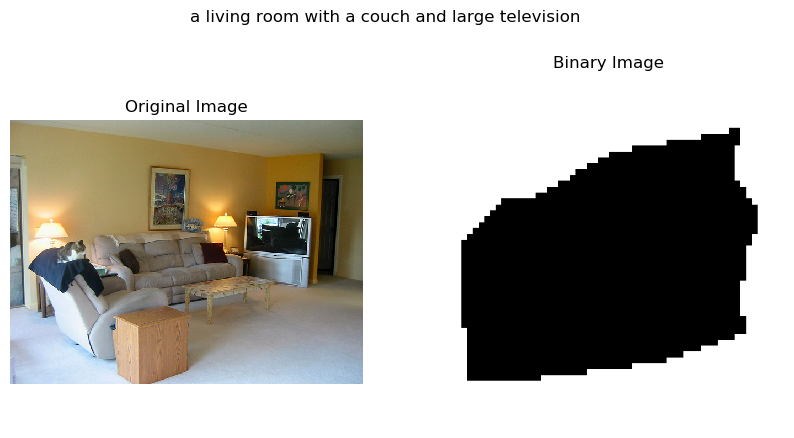

coco_dataset/val2017/000000296649.jpg


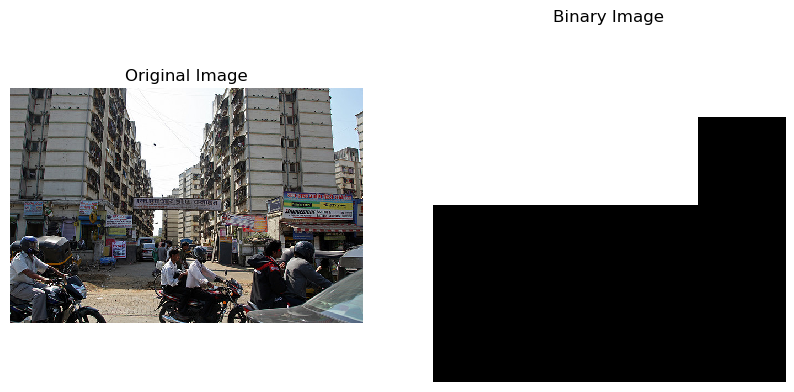

coco_dataset/val2017/000000061171.jpg


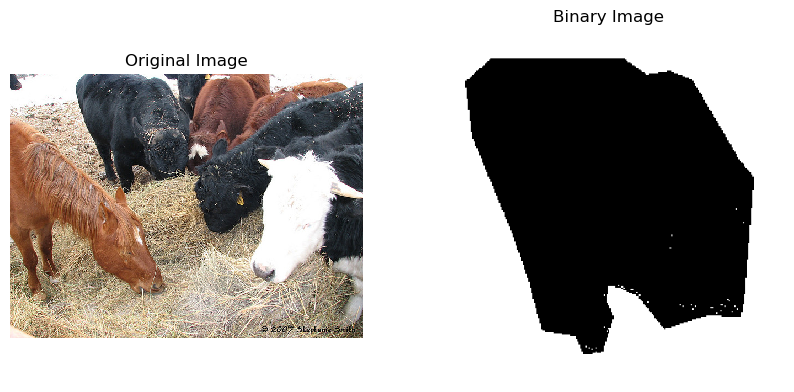

coco_dataset/val2017/000000181666.jpg


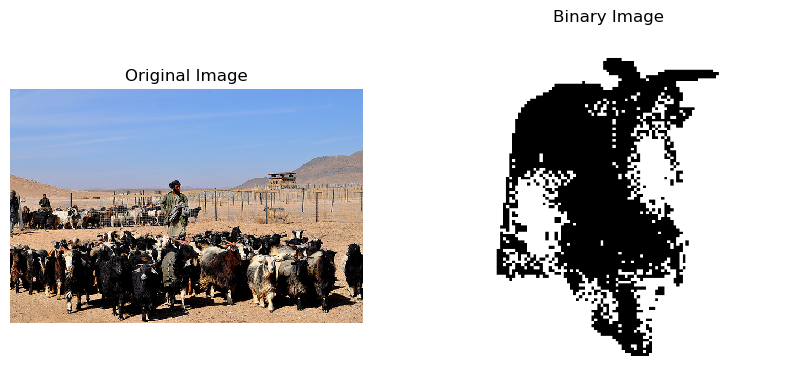

coco_dataset/val2017/000000314034.jpg


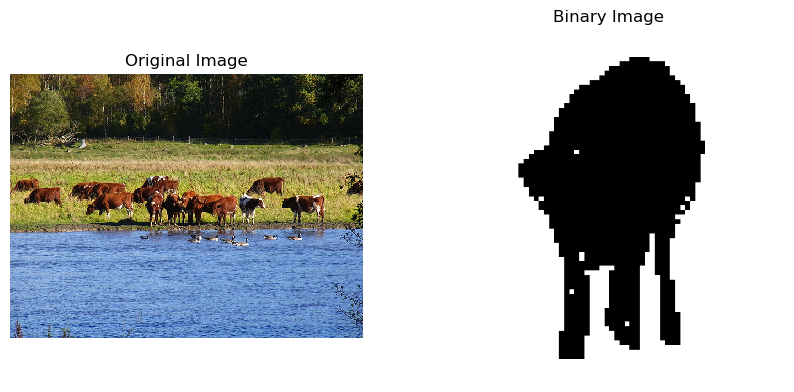

coco_dataset/val2017/000000402992.jpg


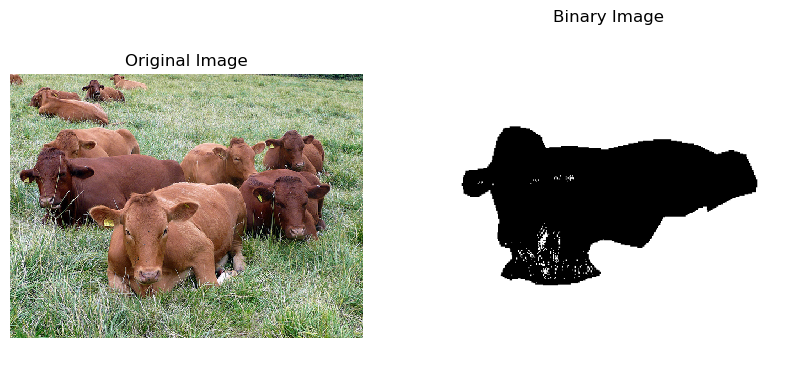

coco_dataset/val2017/000000450758.jpg


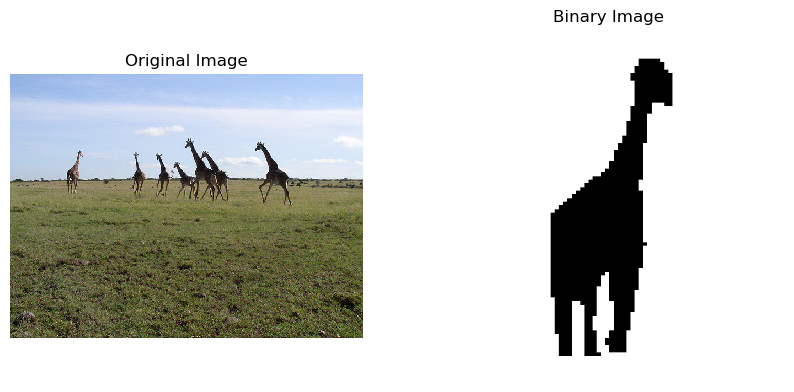

coco_dataset/val2017/000000546011.jpg


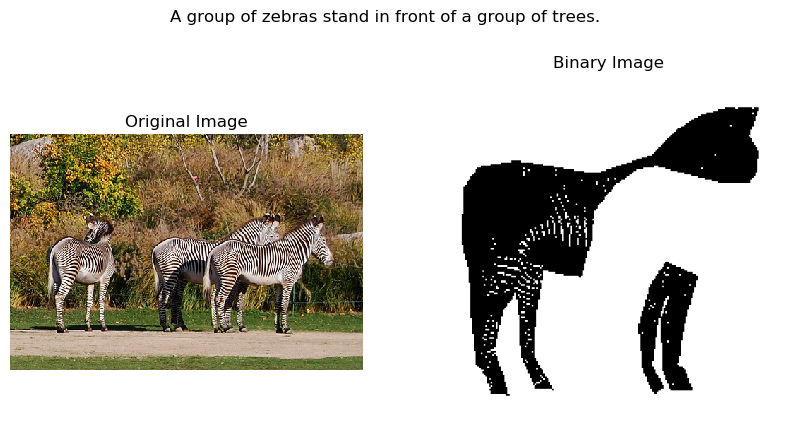

coco_dataset/val2017/000000107226.jpg


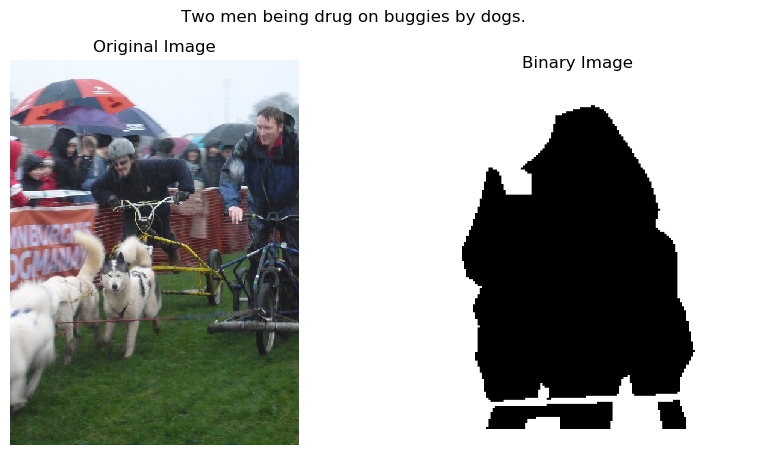

coco_dataset/val2017/000000198960.jpg


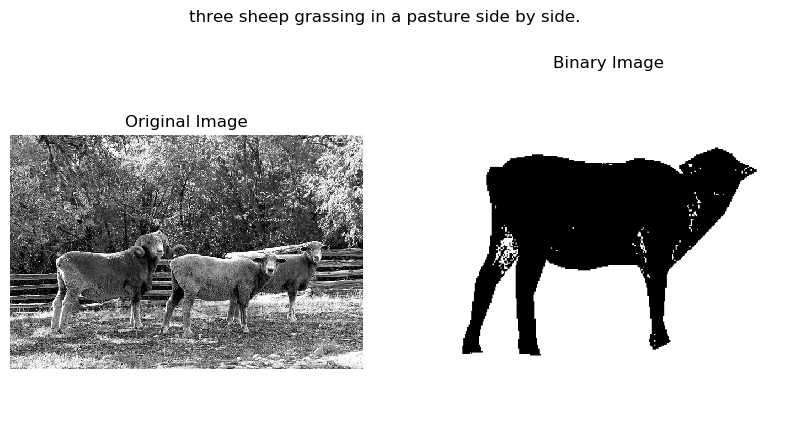

coco_dataset/val2017/000000458755.jpg


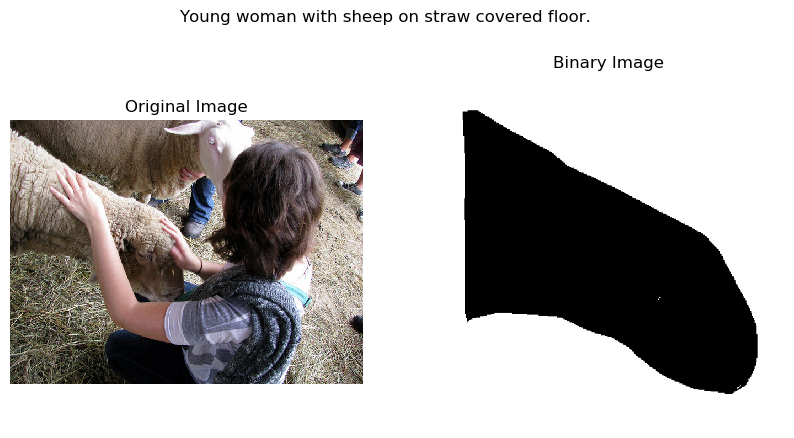

coco_dataset/val2017/000000227187.jpg


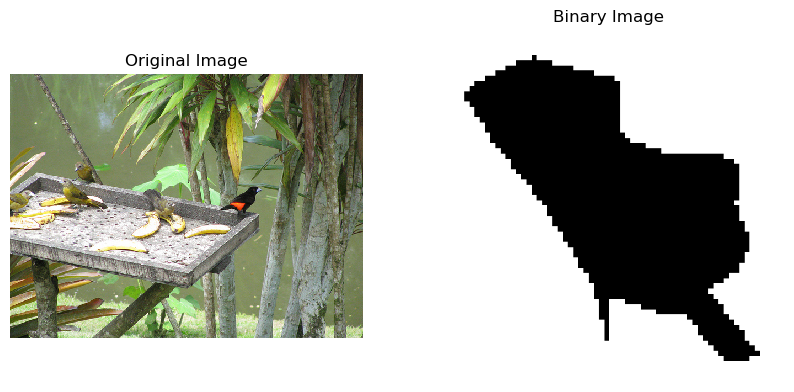

coco_dataset/val2017/000000456496.jpg


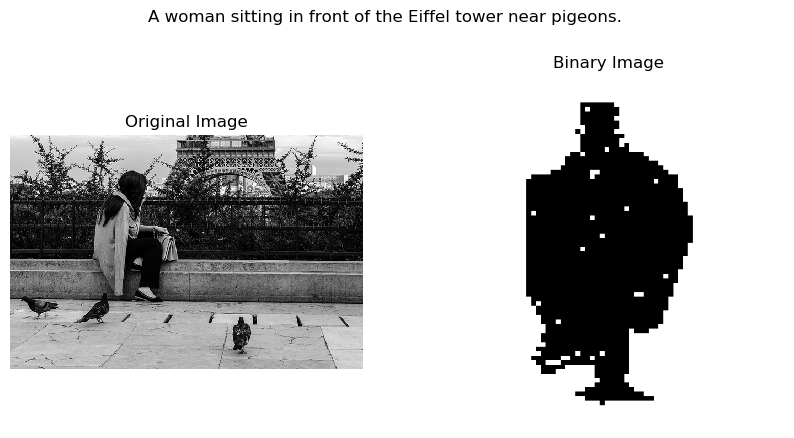

coco_dataset/val2017/000000314034.jpg


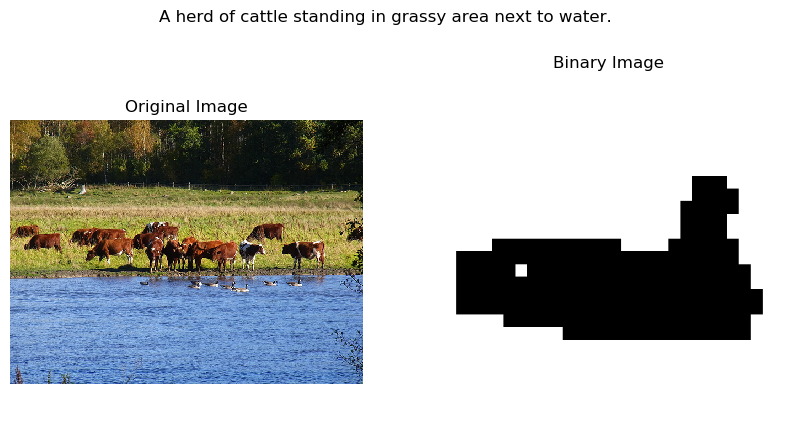

coco_dataset/val2017/000000314034.jpg


In [ ]:
import matplotlib.pyplot as plt
import glob

def zero_fill_string(input_string):
    # Check the length of the string
    if len(input_string) < 12:
        # If the length is less than 12, fill with leading zeros
        input_string = input_string.zfill(12)
    return input_string

# Get all the binary image files in the output folder
binary_image_files = glob.glob(os.path.join("binary_dataset", '*.png'))

# Go through all of the image files
for binary_image_file in binary_image_files:
    # Load binary image
    binary_img = cv2.imread(binary_image_file, cv2.IMREAD_GRAYSCALE)

    # Load original image
    original_image_file = os.path.join("coco_dataset/val2017", zero_fill_string(binary_image_file.split("/")[-1].split('_')[0]) + '.jpg')
    print(original_image_file)
    original_img = cv2.imread(original_image_file)
    original_img_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)  # Convert to RGB for plotting

    # Load description
    description_file = binary_image_file.replace('.png', '.txt')
    with open(description_file, 'r') as f:
        description = f.read()

    # Show the original image, binary image, and description
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original_img_rgb)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(binary_img, cmap='gray')
    plt.title('Binary Image')
    plt.axis('off')

    plt.suptitle(description)
    plt.show()